<a href="https://colab.research.google.com/github/Ishita2patel/CIND820-Project/blob/main/data_Balancing.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [8]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

df = pd.read_csv("online_shoppers_intention.csv")
df


,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue
0,0,0.0,0,0.0,1,0.000000,0.200000,0.200000,0.000000,0.0,Feb,1,1,1,1,Returning_Visitor,False,False
1,0,0.0,0,0.0,2,64.000000,0.000000,0.100000,0.000000,0.0,Feb,2,2,1,2,Returning_Visitor,False,False
2,0,0.0,0,0.0,1,0.000000,0.200000,0.200000,0.000000,0.0,Feb,4,1,9,3,Returning_Visitor,False,False
3,0,0.0,0,0.0,2,2.666667,0.050000,0.140000,0.000000,0.0,Feb,3,2,2,4,Returning_Visitor,False,False
4,0,0.0,0,0.0,10,627.500000,0.020000,0.050000,0.000000,0.0,Feb,3,3,1,4,Returning_Visitor,True,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12325,3,145.0,0,0.0,53,1783.791667,0.007143,0.029031,12.241717,0.0,Dec,4,6,1,1,Returning_Visitor,True,False
12326,0,0.0,0,0.0,5,465.750000,0.000000,0.021333,0.000000,0.0,Nov,3,2,1,8,Returning_Visitor,True,False
12327,0,0.0,0,0.0,6,184.250000,0.083333,0.086667,0.000000,0.0,Nov,3,2,1,13,Returning_Visitor,True,False
12328,4,75.0,0,0.0,15,346.000000,0.000000,0.021053,0.000000,0.0,Nov,2,2,3,11,Returning_Visitor,False,False


In [9]:
df.shape

(12330, 18)

In [10]:
# describing the data

df.describe()


,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,OperatingSystems,Browser,Region,TrafficType
count,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000
mean,2.315166,80.818611,0.503569,34.472398,31.731468,1194.746220,0.022191,0.043073,5.889258,0.061427,2.124006,2.357097,3.147364,4.069586
std,3.321784,176.779107,1.270156,140.749294,44.475503,1913.669288,0.048488,0.048597,18.568437,0.198917,0.911325,1.717277,2.401591,4.025169
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000
25%,0.000000,0.000000,0.000000,0.000000,7.000000,184.137500,0.000000,0.014286,0.000000,0.000000,2.000000,2.000000,1.000000,2.000000
50%,1.000000,7.500000,0.000000,0.000000,18.000000,598.936905,0.003112,0.025156,0.000000,0.000000,2.000000,2.000000,3.000000,2.000000
75%,4.000000,93.256250,0.000000,0.000000,38.000000,1464.157214,0.016813,0.050000,0.000000,0.000000,3.000000,2.000000,4.000000,4.000000
max,27.000000,3398.750000,24.000000,2549.375000,705.000000,63973.522230,0.200000,0.200000,361.763742,1.000000,8.000000,13.000000,9.000000,20.000000


In [11]:
# checking if the data contains any NULL values

df.isnull().sum().sum()

0

In [12]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12330 entries, 0 to 12329
Data columns (total 18 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Administrative           12330 non-null  int64  
 1   Administrative_Duration  12330 non-null  float64
 2   Informational            12330 non-null  int64  
 3   Informational_Duration   12330 non-null  float64
 4   ProductRelated           12330 non-null  int64  
 5   ProductRelated_Duration  12330 non-null  float64
 6   BounceRates              12330 non-null  float64
 7   ExitRates                12330 non-null  float64
 8   PageValues               12330 non-null  float64
 9   SpecialDay               12330 non-null  float64
 10  Month                    12330 non-null  object 
 11  OperatingSystems         12330 non-null  int64  
 12  Browser                  12330 non-null  int64  
 13  Region                   12330 non-null  int64  
 14  TrafficType           

Data type transformation

In [13]:
df.Revenue = df.Revenue.astype('int')
df.Weekend = df.Weekend.astype('int')

In [14]:
#d_month = {'Jan':1,'Feb':2, 'Mar':3,'Apr':4, 'May':5, 'June':6, 'Jul':7, 'Aug':8, 'Sep':9, 'Oct':10,'Nov':11, 'Dec':12}
#d_visitor = {'Returning_Visitor': 1,'New_Visitor':2, 'Other':3}
#df.Month = df.Month.map(d_month)
#df.VisitorType = df.VisitorType.map(d_visitor)

The attributes Revenue and Weekend were changed from boolean into binary, use them more easily for calculations.
The attributes Month and Visitor were changed from object into int

Dataset with modified values

In [25]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12330 entries, 0 to 12329
Data columns (total 18 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Administrative           12330 non-null  int64  
 1   Administrative_Duration  12330 non-null  float64
 2   Informational            12330 non-null  int64  
 3   Informational_Duration   12330 non-null  float64
 4   ProductRelated           12330 non-null  int64  
 5   ProductRelated_Duration  12330 non-null  float64
 6   BounceRates              12330 non-null  float64
 7   ExitRates                12330 non-null  float64
 8   PageValues               12330 non-null  float64
 9   SpecialDay               12330 non-null  float64
 10  Month                    12330 non-null  object 
 11  OperatingSystems         12330 non-null  int64  
 12  Browser                  12330 non-null  int64  
 13  Region                   12330 non-null  int64  
 14  TrafficType           

In [16]:
df.describe()

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue
count,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000
mean,2.315166,80.818611,0.503569,34.472398,31.731468,1194.746220,0.022191,0.043073,5.889258,0.061427,7.651987,2.124006,2.357097,3.147364,4.069586,1.151176,0.232603,0.154745
std,3.321784,176.779107,1.270156,140.749294,44.475503,1913.669288,0.048488,0.048597,18.568437,0.198917,3.392841,0.911325,1.717277,2.401591,4.025169,0.376989,0.422509,0.361676
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,7.000000,184.137500,0.000000,0.014286,0.000000,0.000000,5.000000,2.000000,2.000000,1.000000,2.000000,1.000000,0.000000,0.000000
50%,1.000000,7.500000,0.000000,0.000000,18.000000,598.936905,0.003112,0.025156,0.000000,0.000000,7.000000,2.000000,2.000000,3.000000,2.000000,1.000000,0.000000,0.000000
75%,4.000000,93.256250,0.000000,0.000000,38.000000,1464.157214,0.016813,0.050000,0.000000,0.000000,11.000000,3.000000,2.000000,4.000000,4.000000,1.000000,0.000000,0.000000
max,27.000000,3398.750000,24.000000,2549.375000,705.000000,63973.522230,0.200000,0.200000,361.763742,1.000000,12.000000,8.000000,13.000000,9.000000,20.000000,3.000000,1.000000,1.000000


Correlation Matrix

   Administrative  Administrative_Duration  Informational  \
0               0                      0.0              0   
1               0                      0.0              0   
2               0                      0.0              0   
3               0                      0.0              0   
4               0                      0.0              0   

   Informational_Duration  ProductRelated  ProductRelated_Duration  \
0                     0.0               1                 0.000000   
1                     0.0               2                64.000000   
2                     0.0               1                 0.000000   
3                     0.0               2                 2.666667   
4                     0.0              10               627.500000   

   BounceRates  ExitRates  PageValues  SpecialDay Month  OperatingSystems  \
0         0.20       0.20         0.0         0.0   Feb                 1   
1         0.00       0.10         0.0         0.0   Feb   

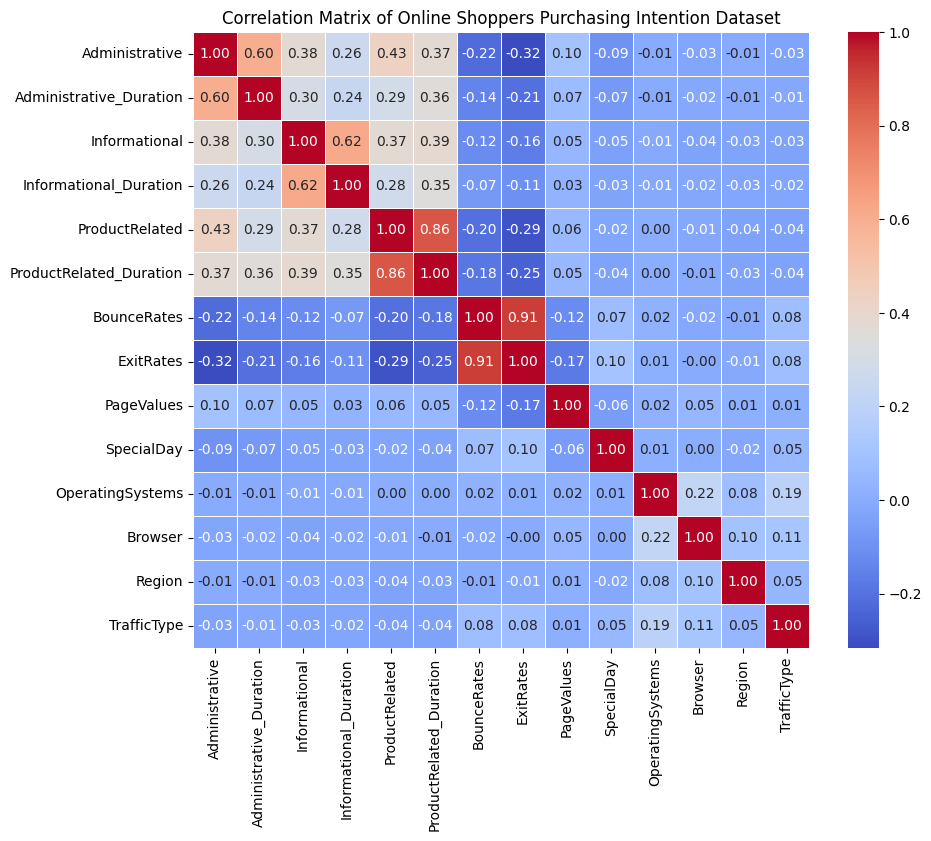

In [17]:
# Import necessary libraries
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load the dataset
df = pd.read_csv('online_shoppers_intention.csv')  # Replace with your actual file path

# Display the first few rows and the data types of the dataframe
print(df.head())
print(df.dtypes)

# Select only numerical columns for correlation
numerical_df = df.select_dtypes(include=['float64', 'int64'])

# Calculate the correlation matrix
correlation_matrix = numerical_df.corr()

# Set up the matplotlib figure
plt.figure(figsize=(10, 8))

# Draw the heatmap using seaborn
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap="coolwarm", square=True, linewidths=0.5)

# Add title to the plot
plt.title('Correlation Matrix of Online Shoppers Purchasing Intention Dataset')

# Show the plot
plt.show()



Data Balancing

In [18]:
from time import process_time

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import LabelEncoder
from sklearn.tree import DecisionTreeClassifier
from sklearn.compose import ColumnTransformer
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

Identifying and transforming categorical attributes

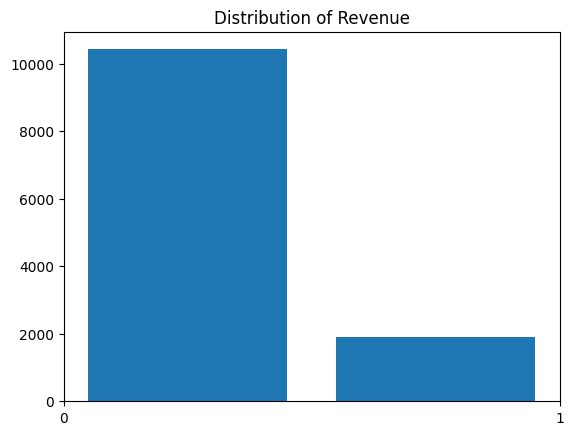

In [29]:
#Identify categorical attributes
categorical_features = ["Month", "OperatingSystems", "Browser", "Region", "TrafficType", "VisitorType", "Weekend"]
df_cat = df[categorical_features]

df_onehot = pd.get_dummies(df, columns = categorical_features, prefix = categorical_features)

#Tranform categorical attributes
label_encoder = LabelEncoder()
df_onehot['Revenue'] = label_encoder.fit_transform(df['Revenue'])

plt.hist(df_onehot['Revenue'], bins = 2, rwidth = 0.8, align = 'mid')
plt.xticks(np.arange(0,2,1))
plt.title("Distribution of Revenue")
plt.show()

In [27]:
#Specify independent/ dependent values
X = df_onehot.drop(columns = "Revenue")
y = df_onehot["Revenue"]

#Split the Data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3)

Imbalanced, Raw Dataset

In [28]:
#Initialize the DecisionTreeClassifier
tree_raw_imbalanced = DecisionTreeClassifier(criterion = "entropy")

#Time Measurement
start_time = process_time()

#Fit the Classifier to the data
tree_raw_imbalanced.fit(X_train, y_train)

#Predict new Data
y_pred = tree_raw_imbalanced.predict(X_test)

#Time Measurement
end_time = process_time()

#Results
cr = classification_report(y_test, y_pred)
cm = confusion_matrix(y_test, y_pred)
time = end_time - start_time
print(cr)
print(cm)
print(time)

              precision    recall  f1-score   support

           0       0.92      0.92      0.92      3115
           1       0.59      0.57      0.58       584

    accuracy                           0.87      3699
   macro avg       0.75      0.75      0.75      3699
weighted avg       0.87      0.87      0.87      3699

[[2879  236]
 [ 249  335]]
0.13806246100000408


Undersampling on Raw Dataset

In [30]:
from imblearn.under_sampling import RandomUnderSampler
from imblearn.over_sampling import RandomOverSampler
from imblearn.over_sampling import SMOTE

In [31]:
#Undersampling
rus = RandomUnderSampler()
X_train_rus, y_train_rus = rus.fit_resample(X_train, y_train)

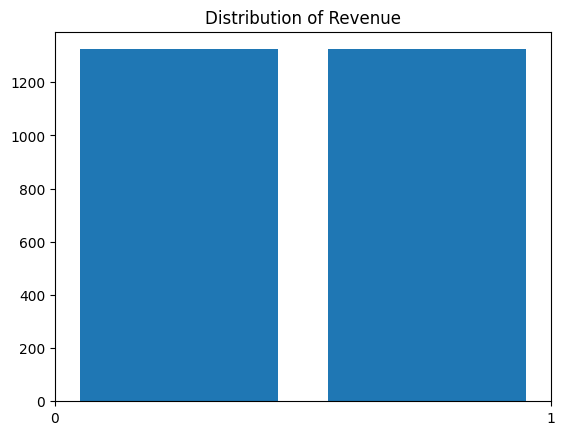

In [32]:
plt.hist(y_train_rus, bins = 2, rwidth = 0.8, align = 'mid')
plt.xticks(np.arange(0,2,1))
plt.title("Distribution of Revenue")
plt.show()

In [33]:
#Initialize the DecisionTreeClassifier
tree_raw_imbalanced = DecisionTreeClassifier(criterion = "entropy")

#Time Measurement
start_time = process_time()

#Fit the Classifier to the data
tree_raw_imbalanced.fit(X_train_rus, y_train_rus)

#Predict new Data
y_pred = tree_raw_imbalanced.predict(X_test)

#Time Measurement
end_time = process_time()

#Results
cr = classification_report(y_test, y_pred)
cm = confusion_matrix(y_test, y_pred)
time = end_time - start_time
print(cr)
print(cm)
print(time)

              precision    recall  f1-score   support

           0       0.95      0.79      0.86      3115
           1       0.41      0.79      0.54       584

    accuracy                           0.79      3699
   macro avg       0.68      0.79      0.70      3699
weighted avg       0.87      0.79      0.81      3699

[[2459  656]
 [ 124  460]]
0.05574929800002337


Oversampling on Raw Dataset

In [34]:
#Oversampling
ros = RandomOverSampler()
X_train_ros, y_train_ros = ros.fit_resample(X_train, y_train)

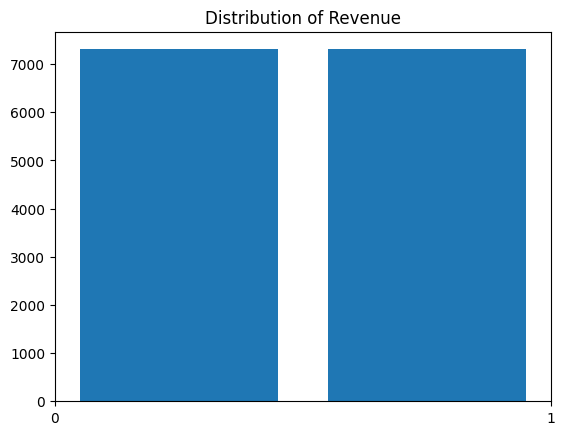

In [35]:
plt.hist(y_train_ros, bins = 2, rwidth = 0.8, align = 'mid')
plt.xticks(np.arange(0,2,1))
plt.title("Distribution of Revenue")
plt.show()

In [36]:
#Initialize the DecisionTreeClassifier
tree_raw_imbalanced = DecisionTreeClassifier(criterion = "entropy")

#Time Measurement
start_time = process_time()

#Fit the Classifier to the data
tree_raw_imbalanced.fit(X_train_ros, y_train_ros)

#Predict new Data
y_pred = tree_raw_imbalanced.predict(X_test)

#Time Measurement
end_time = process_time()

#Results
cr = classification_report(y_test, y_pred)
cm = confusion_matrix(y_test, y_pred)
time = end_time - start_time
print(cr)
print(cm)
print(time)

              precision    recall  f1-score   support

           0       0.92      0.91      0.92      3115
           1       0.55      0.57      0.56       584

    accuracy                           0.86      3699
   macro avg       0.74      0.74      0.74      3699
weighted avg       0.86      0.86      0.86      3699

[[2847  268]
 [ 250  334]]
0.20487774299999728


SMOTE

In [37]:
#SMOTE
smote = SMOTE()
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)

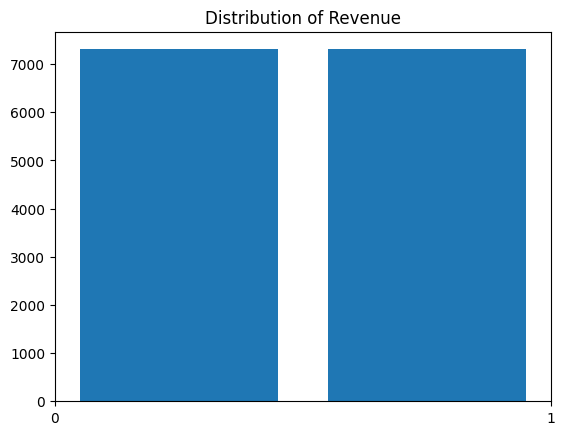

In [38]:
plt.hist(y_train_smote, bins = 2, rwidth = 0.8, align = 'mid')
plt.xticks(np.arange(0,2,1))
plt.title("Distribution of Revenue")
plt.show()

In [39]:
#Initialize the DecisionTreeClassifier
tree_raw_imbalanced = DecisionTreeClassifier(criterion = "entropy")

#Time Measurement
start_time = process_time()

#Fit the Classifier to the data
tree_raw_imbalanced.fit(X_train_smote, y_train_smote)

#Predict new Data
y_pred = tree_raw_imbalanced.predict(X_test)

#Time Measurement
end_time = process_time()

#Results
cr = classification_report(y_test, y_pred)
cm = confusion_matrix(y_test, y_pred)
time = end_time - start_time
print(cr)
print(cm)
print(time)

              precision    recall  f1-score   support

           0       0.93      0.91      0.92      3115
           1       0.56      0.62      0.59       584

    accuracy                           0.86      3699
   macro avg       0.74      0.77      0.75      3699
weighted avg       0.87      0.86      0.87      3699

[[2831  284]
 [ 221  363]]
0.2598606050000285


In [22]:
!pip install ydata-profiling
import pandas as pd
from ydata_profiling import ProfileReport

# Load the dataset (replace 'your_dataset.csv' with your actual file path)
df = pd.read_csv('online_shoppers_intention.csv')

# Generate the EDA report
profile = ProfileReport(df, title="Online Shoppers Purchasing Intention Dataset EDA Report", explorative=True)

# Save the report as an HTML file
profile.to_file("EDA_Report.html")

# Display report within a Jupyter Notebook (if applicable)
profile.to_notebook_iframe()


  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 390.0/390.0 kB 21.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 26.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 686.1/686.1 kB 25.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.8/104.8 kB 9.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 73.4 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27081 sha256=e6a3e91c4895ac99fa3ff6531742d7fb606fab42609fbcdbf0baf17377bc9582
  Stored in directory: /root/.cache/pip/wheels/dd/91/29/a79cecb328d01739e64017b6fb9a1ab9d8cb1853098ec5966d
Successfully built htmlmin


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [23]:
from ydata_profiling import ProfileReport

# Assume df is your DataFrame
profile = ProfileReport(df, title="Online Shoppers Purchasing Intention Dataset EDA")
profile.to_file("Online_Shoppers_EDA_Report.html")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [24]:
from google.colab import files

# Download the file
files.download("Online_Shoppers_EDA_Report.html")


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>